# <font color= Orange>Olympics Data Analysis<font/>

## <font color= green>By Sudhanshi<font/>

### This is a historical dataset on the modern Olympic Games, including all the Games from Athens 1896 to Rio 2016. I scraped this data from Kaggle

   *   This dataset provides an opportunity to ask questions about how the Olympics have evolved over time, including questions about the participation and performance of women, different nations, and different sports and events.

In [3]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [4]:
# Load dataset
athletes = pd.read_csv('athlete_events.csv')
regions= pd.read_csv('noc_regions.csv')

In [5]:
pd.set_option('display.max_columns',None,'display.max_rows',None)

In [6]:
athletes.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN


In [7]:
athletes.shape

(271116, 15)

In [8]:
# * NOC = National Olympic Committee

In [9]:
regions.head()

,NOC,region,notes
0,AFG,Afghanistan,NaN
1,AHO,Curacao,Netherlands Antilles
2,ALB,Albania,NaN
3,ALG,Algeria,NaN
4,AND,Andorra,NaN


In [10]:
# Join the dataframes
athletes_df = athletes.merge(regions,how ='left',on ='NOC')

In [11]:
athletes_df.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN,China,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN,China,NaN
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN,Denmark,NaN
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark,NaN
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN,Netherlands,NaN


In [12]:
athletes_df.shape

(271116, 17)

In [13]:
athletes_df.isnull().sum()

ID             0
Name           0
Sex            0
Age         9474
Height     60171
Weight     62875
Team           0
NOC            0
Games          0
Year           0
Season         0
City           0
Sport          0
Event          0
Medal     231333
region       370
notes     266077
dtype: int64

#### Percentage of missing value before Imputing 

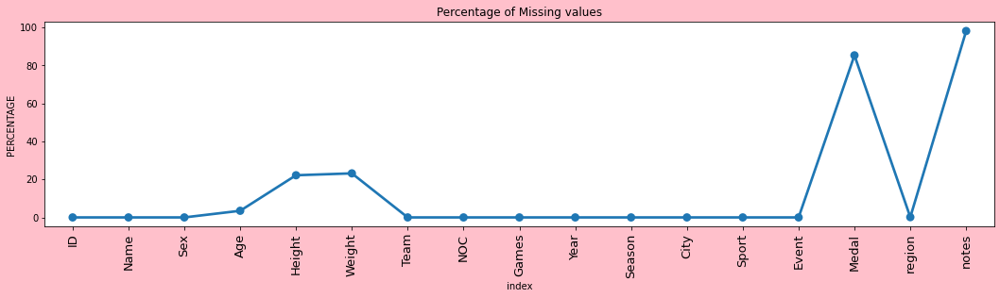

In [14]:
fig=plt.figure(figsize=(18,4))
missing = pd.DataFrame((athletes_df.isnull().sum())*100/athletes_df.shape[0]).reset_index()
ax = sns.pointplot('index',0,data=missing)
plt.xticks(rotation = 90,fontsize =13)
plt.title("Percentage of Missing values")
plt.ylabel("PERCENTAGE")
fig.set_facecolor('pink')
plt.show()

#### Imputing the missing values for Age,  Height and  Weight columns with its mean value

In [15]:
imp_col = ['Age', 'Height', 'Weight']
for col in imp_col:
    athletes_df[col] = athletes_df[col].fillna(np.mean(athletes_df[col]))
    athletes_df[col] = np.round(athletes_df[col],1)

#### Percentage of NA value after Imputing

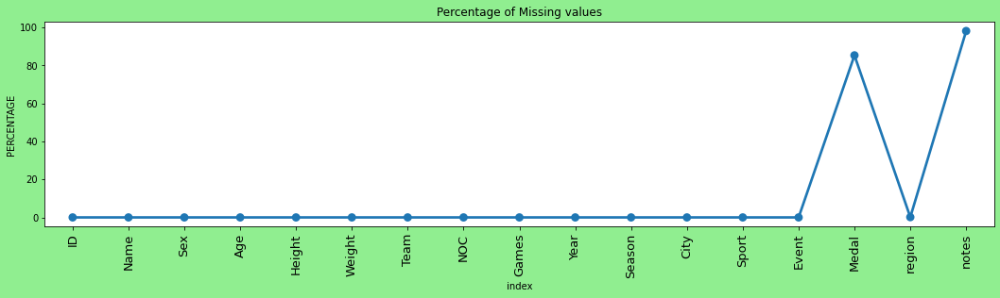

In [16]:
fig=plt.figure(figsize=(18,4))
miss = pd.DataFrame((athletes_df.isnull().sum())*100/athletes_df.shape[0]).reset_index()
ax = sns.pointplot('index',0,data=miss)
plt.xticks(rotation = 90,fontsize =13)
plt.title("Percentage of Missing values")
plt.ylabel("PERCENTAGE")
fig.set_facecolor('lightgreen')
plt.show()

In [17]:
athletes_df.rename(columns={'region':"Region",'notes':'Notes'},inplace=True)
athletes_df.head()


,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,Region,Notes
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN,China,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN,China,NaN
2,3,Gunnar Nielsen Aaby,M,24.0,175.3,70.7,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN,Denmark,NaN
3,4,Edgar Lindenau Aabye,M,34.0,175.3,70.7,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark,NaN
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN,Netherlands,NaN


In [18]:
athletes_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 271116 entries, 0 to 271115
Data columns (total 17 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   ID      271116 non-null  int64  
 1   Name    271116 non-null  object 
 2   Sex     271116 non-null  object 
 3   Age     271116 non-null  float64
 4   Height  271116 non-null  float64
 5   Weight  271116 non-null  float64
 6   Team    271116 non-null  object 
 7   NOC     271116 non-null  object 
 8   Games   271116 non-null  object 
 9   Year    271116 non-null  int64  
 10  Season  271116 non-null  object 
 11  City    271116 non-null  object 
 12  Sport   271116 non-null  object 
 13  Event   271116 non-null  object 
 14  Medal   39783 non-null   object 
 15  Region  270746 non-null  object 
 16  Notes   5039 non-null    object 
dtypes: float64(3), int64(2), object(12)
memory usage: 37.2+ MB


In [19]:
athletes_df.describe()

,ID,Age,Height,Weight,Year
count,271116.000000,271116.000000,271116.000000,271116.000000,271116.000000
mean,68248.954396,25.558405,175.330321,70.701838,1978.378480
std,39022.286345,6.280862,9.278115,12.574690,29.877632
min,1.000000,10.000000,127.000000,25.000000,1896.000000
25%,34643.000000,22.000000,170.000000,63.000000,1960.000000
50%,68205.000000,25.000000,175.300000,70.700000,1988.000000
75%,102097.250000,28.000000,180.000000,75.000000,2002.000000
max,135571.000000,97.000000,226.000000,214.000000,2016.000000


In [20]:
print('Column Names:',athletes_df.columns)

Column Names: Index(['ID', 'Name', 'Sex', 'Age', 'Height', 'Weight', 'Team', 'NOC', 'Games',
       'Year', 'Season', 'City', 'Sport', 'Event', 'Medal', 'Region', 'Notes'],
      dtype='object')


In [21]:
# India Details
athletes_df.query('Team == "India"')

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,Region,Notes
505,281,S. Abdul Hamid,M,25.6,175.3,70.7,India,IND,1928 Summer,1928,Summer,Amsterdam,Athletics,Athletics Men's 110 metres Hurdles,NaN,India,NaN
506,281,S. Abdul Hamid,M,25.6,175.3,70.7,India,IND,1928 Summer,1928,Summer,Amsterdam,Athletics,Athletics Men's 400 metres Hurdles,NaN,India,NaN
895,512,Shiny Kurisingal Abraham-Wilson,F,19.0,167.0,53.0,India,IND,1984 Summer,1984,Summer,Los Angeles,Athletics,Athletics Women's 800 metres,NaN,India,NaN
896,512,Shiny Kurisingal Abraham-Wilson,F,19.0,167.0,53.0,India,IND,1984 Summer,1984,Summer,Los Angeles,Athletics,Athletics Women's 4 x 400 metres Relay,NaN,India,NaN
897,512,Shiny Kurisingal Abraham-Wilson,F,23.0,167.0,53.0,India,IND,1988 Summer,1988,Summer,Seoul,Athletics,Athletics Women's 800 metres,NaN,India,NaN
898,512,Shiny Kurisingal Abraham-Wilson,F,23.0,167.0,53.0,India,IND,1988 Summer,1988,Summer,Seoul,Athletics,Athletics Women's 4 x 400 metres Relay,NaN,India,NaN
899,512,Shiny Kurisingal Abraham-Wilson,F,27.0,167.0,53.0,India,IND,1992 Summer,1992,Summer,Barcelona,Athletics,Athletics Women's 800 metres,NaN,India,NaN
900,512,Shiny Kurisingal Abraham-Wilson,F,31.0,167.0,53.0,India,IND,1996 Summer,1996,Summer,Atlanta,Athletics,Athletics Women's 4 x 400 metres Relay,NaN,India,NaN
1183,663,Sharath Kamal Achanta,M,22.0,186.0,85.0,India,IND,2004 Summer,2004,Summer,Athina,Table Tennis,Table Tennis Men's Singles,NaN,India,NaN
1184,663,Sharath Kamal Achanta,M,26.0,186.0,85.0,India,IND,2008 Summer,2008,Summer,Beijing,Table Tennis,Table Tennis Men's Singles,NaN,India,NaN


In [22]:
# Japan Details
athletes_df.query('Team == "Japan"').head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,Region,Notes
625,362,Isao Ko Abe,M,24.0,177.0,75.0,Japan,JPN,1936 Summer,1936,Summer,Berlin,Athletics,Athletics Men's Hammer Throw,NaN,Japan,NaN
629,363,Kazumi Abe,M,28.0,178.0,67.0,Japan,JPN,1976 Winter,1976,Winter,Innsbruck,Bobsleigh,Bobsleigh Men's Four,NaN,Japan,NaN
630,364,Kazuo Abe,M,25.0,166.0,69.0,Japan,JPN,1960 Summer,1960,Summer,Roma,Wrestling,"Wrestling Men's Lightweight, Freestyle",NaN,Japan,NaN
631,365,Kinya Abe,M,23.0,168.0,68.0,Japan,JPN,1992 Summer,1992,Summer,Barcelona,Fencing,"Fencing Men's Foil, Individual",NaN,Japan,NaN
632,366,Kiyoshi Abe,M,25.0,167.0,62.0,Japan,JPN,1972 Summer,1972,Summer,Munich,Wrestling,"Wrestling Men's Featherweight, Freestyle",NaN,Japan,NaN


In [23]:
# Top 5 countries
top_5_coun=athletes_df.Team.value_counts().sort_values(ascending= False).head(5)
top_5_coun

United States    17847
France           11988
Great Britain    11404
Italy            10260
Germany           9326
Name: Team, dtype: int64

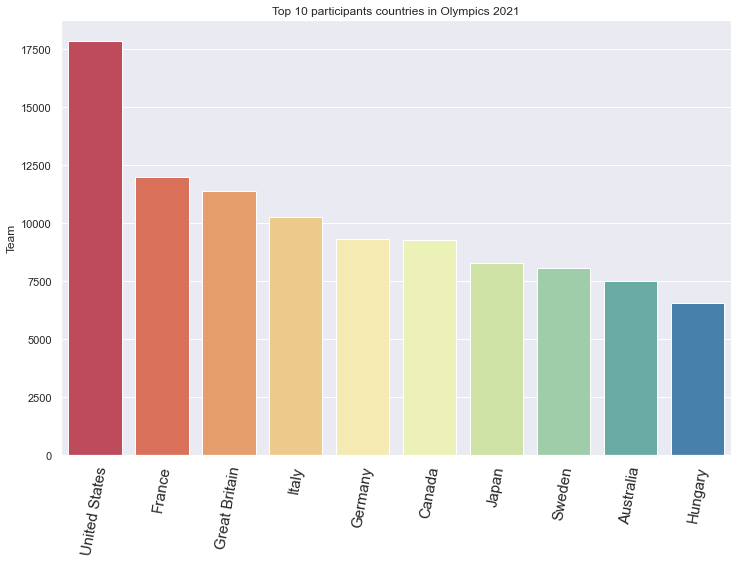

In [24]:
top_10_coun=athletes_df.Team.value_counts().sort_values(ascending= False).head(10)
top_10_coun
plt.figure(figsize=(12,8))
sns.set(style='darkgrid')
plt.xticks(rotation = 80,fontsize =15)
plt.title('Top 10 participants countries in Olympics 2021')
sns.barplot(x=top_10_coun.index,y=top_10_coun,palette='Spectral')
plt.show()

In [25]:
# Bottom 5 countries
bot_5_coun=athletes_df.Team.value_counts().sort_values(ascending= True).head(5)
bot_5_coun

Jeannette-18    1
Whisper         1
Dick-8          1
Gyp-23          1
Ducky-16        1
Name: Team, dtype: int64

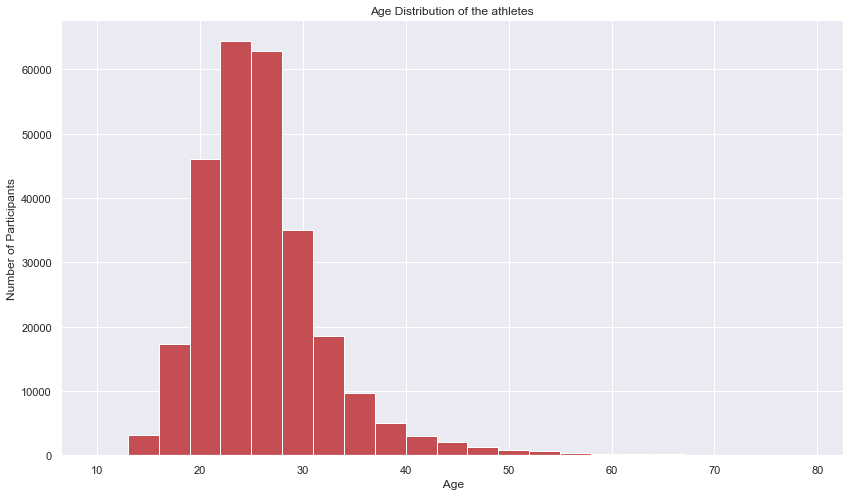

In [26]:
plt.figure(figsize=(14,8))
plt.title('Age Distribution of the athletes')
plt.xlabel(' Age')
plt.ylabel('Number of Participants')
plt.grid(True)
plt.hist(athletes_df.Age, bins = np.arange(10,80,3),color='r', edgecolor = 'white');

In [27]:
winter_sports=athletes_df[athletes_df.Season== 'Winter'].Sport.unique()
winter_sports

array(['Speed Skating', 'Cross Country Skiing', 'Ice Hockey', 'Biathlon',
       'Alpine Skiing', 'Luge', 'Bobsleigh', 'Figure Skating',
       'Nordic Combined', 'Freestyle Skiing', 'Ski Jumping', 'Curling',
       'Snowboarding', 'Short Track Speed Skating', 'Skeleton',
       'Military Ski Patrol', 'Alpinism'], dtype=object)

In [28]:
Summer_sports=athletes_df[athletes_df.Season== 'Summer'].Sport.unique()
Summer_sports

array(['Basketball', 'Judo', 'Football', 'Tug-Of-War', 'Athletics',
       'Swimming', 'Badminton', 'Sailing', 'Gymnastics',
       'Art Competitions', 'Handball', 'Weightlifting', 'Wrestling',
       'Water Polo', 'Hockey', 'Rowing', 'Fencing', 'Equestrianism',
       'Shooting', 'Boxing', 'Taekwondo', 'Cycling', 'Diving', 'Canoeing',
       'Tennis', 'Modern Pentathlon', 'Golf', 'Softball', 'Archery',
       'Volleyball', 'Synchronized Swimming', 'Table Tennis', 'Baseball',
       'Rhythmic Gymnastics', 'Rugby Sevens', 'Trampolining',
       'Beach Volleyball', 'Triathlon', 'Rugby', 'Lacrosse', 'Polo',
       'Cricket', 'Ice Hockey', 'Racquets', 'Motorboating', 'Croquet',
       'Figure Skating', 'Jeu De Paume', 'Roque', 'Basque Pelota',
       'Alpinism', 'Aeronautics'], dtype=object)

In [28]:
athletes_df.Sex.value_counts()

M    196594
F     74522
Name: Sex, dtype: int64

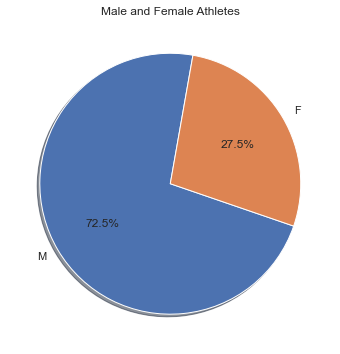

In [29]:
#Male and Female Athletes
Gender_count=athletes_df.Sex.value_counts()
plt.figure(figsize=(14,6))
plt.title('Male and Female Athletes')
plt.pie(Gender_count,labels=Gender_count.index,autopct='%1.1f%%',startangle=80,shadow=True)
plt.show()

In [30]:
athletes_df.Medal.value_counts()

Gold      13372
Bronze    13295
Silver    13116
Name: Medal, dtype: int64

In [35]:
female_athletes= athletes_df[(athletes_df.Sex=='F')&(athletes_df.Season=='Summer')][['Sex','Year']]
female_athletes=female_athletes.groupby('Year').count().reset_index()
female_athletes.tail()

,Year,Sex
23,2000,5431
24,2004,5546
25,2008,5816
26,2012,5815
27,2016,6223


In [36]:
male_atheletes= athletes_df[(athletes_df.Sex=='M')&(athletes_df.Season=='Summer')][['Sex','Year']]
male_atheletes=male_atheletes.groupby('Year').count().reset_index()
male_atheletes.tail()

,Year,Sex
24,2000,8390
25,2004,7897
26,2008,7786
27,2012,7105
28,2016,7465


In [37]:
total_athelete = athletes_df.groupby("Season")["Sex"].count()
print("Total number of athelete in both season\n", total_athelete)

Total number of athelete in both season
 Season
Summer    222552
Winter     48564
Name: Sex, dtype: int64


#### Women participating in Olympic from the year 1896 - 2016

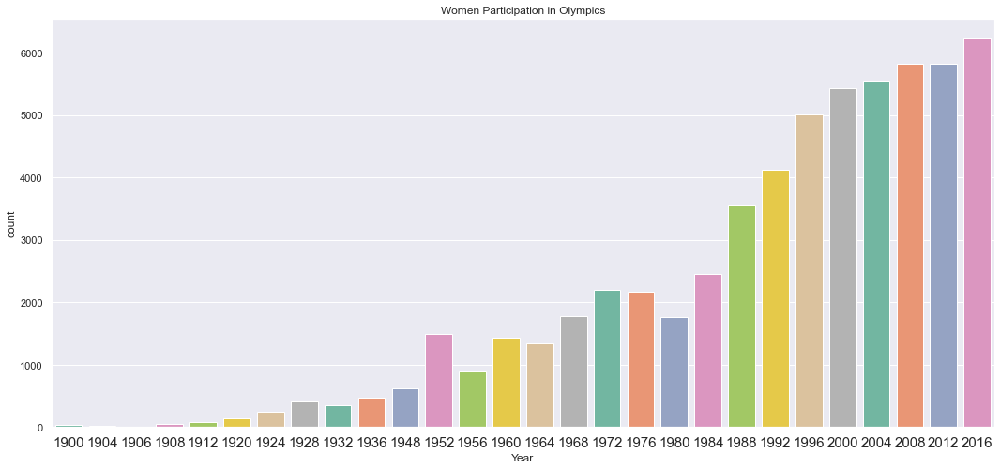

In [38]:
women_olympics=athletes_df[(athletes_df.Sex=='F')&(athletes_df.Season == 'Summer')]
sns.set(style='darkgrid')
plt.figure(figsize=(18,8))
sns.countplot(x='Year',data=women_olympics,palette='Set2')
plt.title('Women Participation in Olympics')
plt.xticks(rotation = 360,fontsize =15)
plt.show()

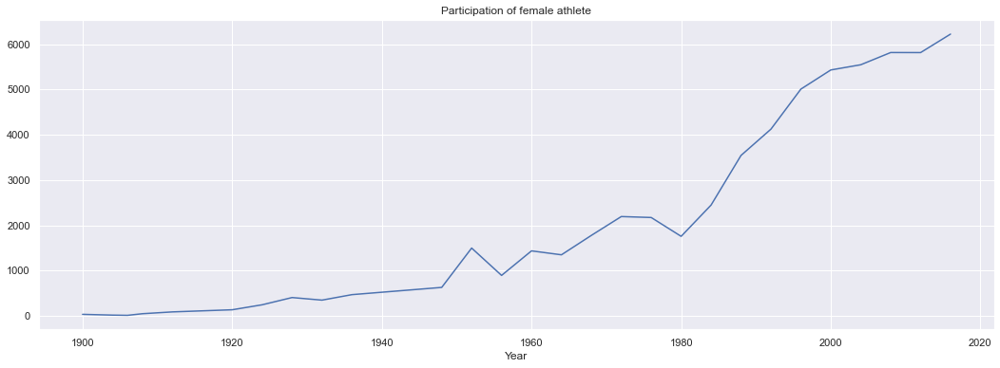

In [39]:
part=women_olympics.groupby('Year')['Sex'].value_counts()
plt.figure(figsize=(18,6))
part.loc[:,'F'].plot()
plt.title('Participation of female athlete')
plt.show()

#### Men participating in Olympic from the year 1896 - 2016

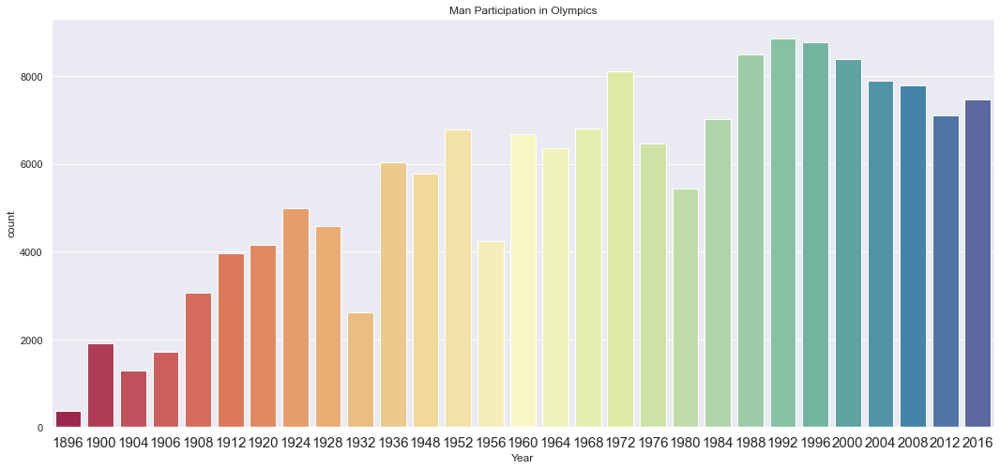

In [40]:
man_olympics=athletes_df[(athletes_df.Sex=='M')&(athletes_df.Season == 'Summer')]
sns.set(style='darkgrid')
plt.figure(figsize=(18,8))
sns.countplot(x='Year',data=man_olympics,palette='Spectral')
plt.title('Man Participation in Olympics')
plt.xticks(rotation = 360,fontsize =15)
plt.show()

In [41]:
Gold_Medal=athletes_df[(athletes_df.Medal == 'Gold')]
Gold_Medal

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,Region,Notes
3,4,Edgar Lindenau Aabye,M,34.0,175.3,70.7,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark,NaN
42,17,Paavo Johannes Aaltonen,M,28.0,175.0,64.0,Finland,FIN,1948 Summer,1948,Summer,London,Gymnastics,Gymnastics Men's Team All-Around,Gold,Finland,NaN
44,17,Paavo Johannes Aaltonen,M,28.0,175.0,64.0,Finland,FIN,1948 Summer,1948,Summer,London,Gymnastics,Gymnastics Men's Horse Vault,Gold,Finland,NaN
48,17,Paavo Johannes Aaltonen,M,28.0,175.0,64.0,Finland,FIN,1948 Summer,1948,Summer,London,Gymnastics,Gymnastics Men's Pommelled Horse,Gold,Finland,NaN
60,20,Kjetil Andr Aamodt,M,20.0,176.0,85.0,Norway,NOR,1992 Winter,1992,Winter,Albertville,Alpine Skiing,Alpine Skiing Men's Super G,Gold,Norway,NaN
73,20,Kjetil Andr Aamodt,M,30.0,176.0,85.0,Norway,NOR,2002 Winter,2002,Winter,Salt Lake City,Alpine Skiing,Alpine Skiing Men's Super G,Gold,Norway,NaN
76,20,Kjetil Andr Aamodt,M,30.0,176.0,85.0,Norway,NOR,2002 Winter,2002,Winter,Salt Lake City,Alpine Skiing,Alpine Skiing Men's Combined,Gold,Norway,NaN
78,20,Kjetil Andr Aamodt,M,34.0,176.0,85.0,Norway,NOR,2006 Winter,2006,Winter,Torino,Alpine Skiing,Alpine Skiing Men's Super G,Gold,Norway,NaN
79,21,Ragnhild Margrethe Aamodt,F,27.0,163.0,70.7,Norway,NOR,2008 Summer,2008,Summer,Beijing,Handball,Handball Women's Handball,Gold,Norway,NaN
113,40,Roald Edgar Aas,M,31.0,175.3,70.7,Norway,NOR,1960 Winter,1960,Winter,Squaw Valley,Speed Skating,"Speed Skating Men's 1,500 metres",Gold,Norway,NaN


In [42]:
Gold_Medal=Gold_Medal[np.isfinite(Gold_Medal['Age'])]

In [43]:
# How many athletes secured gold medal beyond 60

Gold_Medal['ID'][Gold_Medal['Age']>60].count()

6

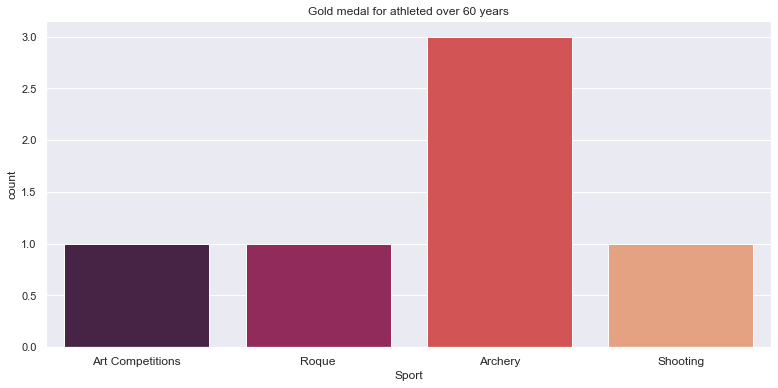

In [44]:
#In which sports athletes secured gold medal who is beyond 60

sport_event=Gold_Medal['Sport'][Gold_Medal['Age']>60]
fig=plt.figure(figsize=(13,6))
sns.countplot(sport_event,palette= 'rocket')
plt.title('Gold medal for athleted over 60 years')
plt.xticks(rotation = 360,fontsize = 12)
plt.show()

In [45]:
totalgoldmedals= Gold_Medal.Region.value_counts().reset_index(name='Medal').head(5)
totalgoldmedals

,index,Medal
0,USA,2638
1,Russia,1599
2,Germany,1301
3,UK,678
4,Italy,575


In [66]:
totalgoldmedals= Gold_Medal.Team.value_counts().reset_index(name='Medal').head(8)
totalgoldmedals

,index,Medal
0,United States,2474
1,Soviet Union,1058
2,Germany,679
3,Italy,535
4,Great Britain,519
5,France,455
6,Sweden,451
7,Hungary,432


In [70]:
silver_Medal=athletes_df[(athletes_df.Medal == 'Silver')]
totalsilvermedals= silver_Medal.Team.value_counts().reset_index(name='Medal').head(8)
totalsilvermedals

,index,Medal
0,United States,1512
1,Soviet Union,716
2,Germany,627
3,Great Britain,582
4,France,518
5,Italy,508
6,Sweden,476
7,Australia,453


In [75]:
bronze_Medal=athletes_df[(athletes_df.Medal == 'Bronze')]
totalbronzemedals= bronze_Medal.Team.value_counts().reset_index(name='Medal').head(8)
totalbronzemedals

,index,Medal
0,United States,1233
1,Germany,678
2,Soviet Union,677
3,France,577
4,Great Britain,572
5,Australia,511
6,Sweden,507
7,Italy,484


In [76]:
# Rio Olympics

max_year = athletes_df.Year.max()
print (max_year)

team_names= athletes_df[(athletes_df.Year == max_year) & (athletes_df.Medal == 'Gold')].Team
team_names.value_counts().head(10)

2016


United States    137
Great Britain     64
Russia            50
Germany           47
China             44
Brazil            34
Australia         23
Argentina         21
France            20
Japan             17
Name: Team, dtype: int64

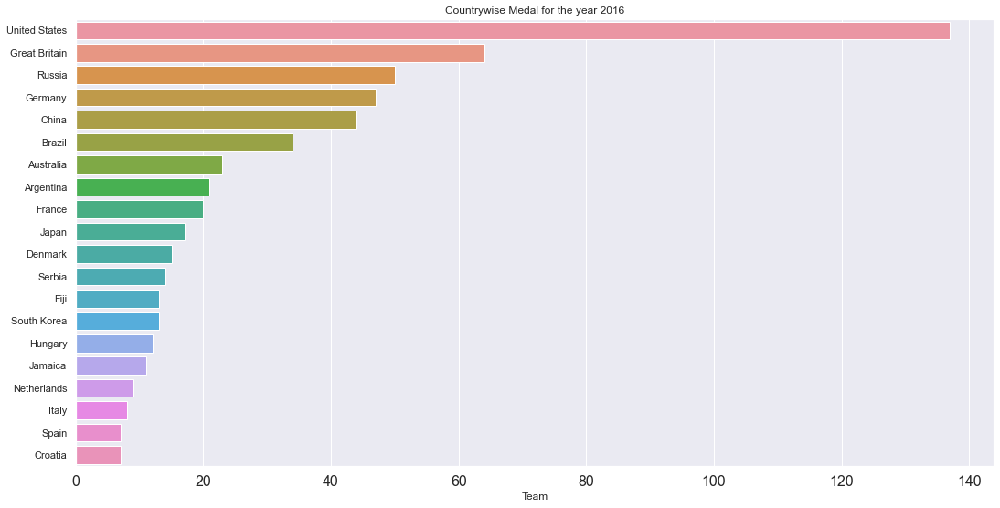

In [77]:
sns.set(style='darkgrid')
plt.figure(figsize=(18,9))
sns.barplot(x=team_names.value_counts().head(20),y=team_names.value_counts().head(20).index) 
plt.xticks(fontsize = 16)
plt.ylabel(None);
plt.title('Countrywise Medal for the year 2016')
plt.show()

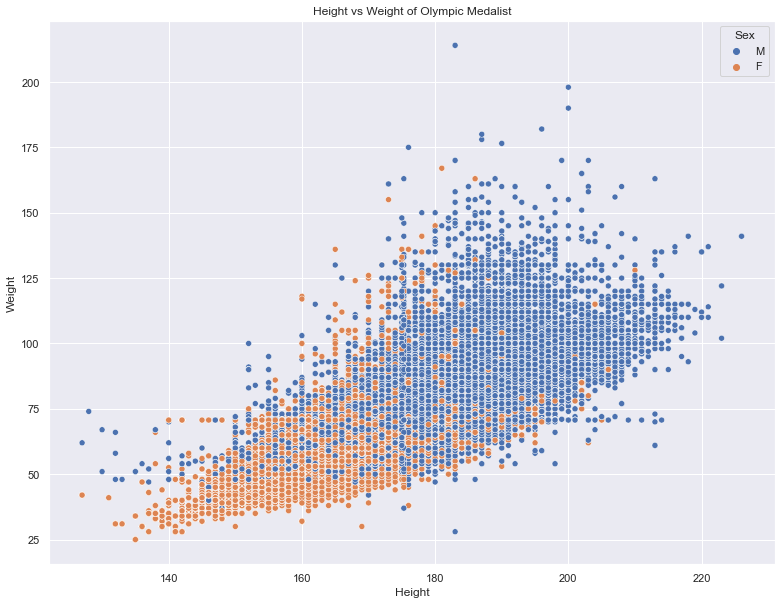

In [78]:
## Height and weight of athletes who won a medal

not_null_medal= athletes_df[(athletes_df['Height'].notnull())& (athletes_df['Weight'].notnull())]

plt.figure(figsize=(13,10))
axis = sns.scatterplot(x='Height',y='Weight',data=not_null_medal,hue='Sex')
plt.title('Height vs Weight of Olympic Medalist')
plt.show()